In [7]:
!pip install --user git+https://github.com/LAL/trackml-library

  Cloning https://github.com/LAL/trackml-library to /tmp/pip-req-build-4n_jah69
  Running command git clone --filter=blob:none --quiet https://github.com/LAL/trackml-library /tmp/pip-req-build-4n_jah69
  Resolved https://github.com/LAL/trackml-library to commit 53a165e15a2c885f54c2bef1bd1ed53db6ed9648
  Preparing metadata (setup.py) ... done
  Created wheel for trackml: filename=trackml-3-py2.py3-none-any.whl size=13512 sha256=75f7519a0c3b3384ec23a8b98636f8d7d7b2ded7f9d70b0594ee371ad4bfad93
  Stored in directory: /tmp/pip-ephem-wheel-cache-4cvzk7k8/wheels/b5/c3/0f/a98b2a87fc80eb4b52ebf38cec0368a4b7e71daeae22fd4ed2
Successfully built trackml
  Attempting uninstall: trackml
    Found existing installation: trackml 0.1.12
    Uninstalling trackml-0.1.12:
      Successfully uninstalled trackml-0.1.12

[notice] A new release of pip available: 22.3 -> 23.0
[notice] To update, run: python3 -m pip install --upgrade pip


In [1]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm_notebook
# print(os.listdir("../input"))
# print(os.listdir("../input/trackml/"))
# prefix='../input/trackml-particle-identification/'
import zipfile

from trackml.dataset import load_event
from trackml.randomize import shuffle_hits
from trackml.score import score_event

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
%matplotlib inline

/home/ubuntu/.local/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [3]:
!pip install kaggle

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.0/59.0 kB 19.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 33.8 MB/s eta 0:00:00
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73052 sha256=9edb9c1d8cb45d7093f5fba2226488c4341bfd89bd22ce099df2458c3260f3ab
  Stored in directory: /home/ubuntu/.cache/pip/wheels/03/f3/c7/fc5a63bb33d22177609b06c5b4c714b5eb3f1b195ce9dc5e47
Successfully built kaggle

[notice] A new release of pip available: 22.3 -> 23.0
[notice] To update, run: python3 -m pip install --upgrade pip


In [4]:
!kaggle competitions download -c trackml-particle-identification

100%|█████████████████████████████████████▉| 75.7G/75.8G [17:14<00:00, 43.4MB/s]
100%|██████████████████████████████████████| 75.8G/75.8G [17:14<00:00, 78.6MB/s]


In [10]:
event_prefix = 'event000001000'
hits, cells, particles, truth = load_event(os.path.join('train_1', event_prefix))

mem_bytes = (hits.memory_usage(index=True).sum() 
             + cells.memory_usage(index=True).sum() 
             + particles.memory_usage(index=True).sum() 
             + truth.memory_usage(index=True).sum())
print('{} memory usage {:.2f} MB'.format(event_prefix, mem_bytes / 2**20))

event000001000 memory usage 18.46 MB


## Hits Data
### Where Did it Hit?
Here we have the $x, y, z$ global coordinates (in millimeters) of where the particles hit the detector surface.

In [11]:
hits.head()

,hit_id,x,y,z,volume_id,layer_id,module_id
0,1,-64.409897,-7.163700,-1502.5,7,2,1
1,2,-55.336102,0.635342,-1502.5,7,2,1
2,3,-83.830498,-1.143010,-1502.5,7,2,1
3,4,-96.109100,-8.241030,-1502.5,7,2,1
4,5,-62.673599,-9.371200,-1502.5,7,2,1


Here is the distribution of $x, y, z$ location of hits in event 1000.  This is only for one out of 8,850 events.

### Vertical Intersection ($x, y$) in Detection Layers
As shown in the figure below, the hits are semi evenly distributed on the detector surface $x, y$.  The white circle in the center of the plot is where the beam pipe lies.  Thanks [agerom] for [the clarification][clar].

The colors represent different detector volumes.  Thanks to [Joshua Bonatt's notebook][josh].

[josh]: https://www.kaggle.com/jbonatt/trackml-eda-etc
[clar]: https://www.kaggle.com/wesamelshamy/trackml-problem-explanation-and-data-exploration/comments#323803
[agerom]: https://www.kaggle.com/artemiosgeromitsos

<Figure size 2160x2160 with 0 Axes>

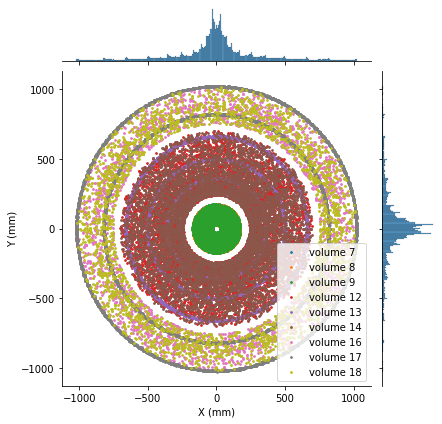

In [13]:
g = sns.jointplot(x=hits.x, y=hits.y,  s=1, size=12)
g.ax_joint.cla()
plt.figure(figsize=(30, 30))
plt.sca(g.ax_joint)

volumes = hits.volume_id.unique()
for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v.x, v.y, s=3, label='volume {}'.format(volume))

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

### Horizonal Intersection ($y, z$) in Detection Layers
You can think of the chart below as a horizontal intersection in the detection surface, where every dot is a hit.  Notice the relationship between the different activity levels in this chart and the one above for $x, y$.

Again, the colors represent different volumes in the detector surface.

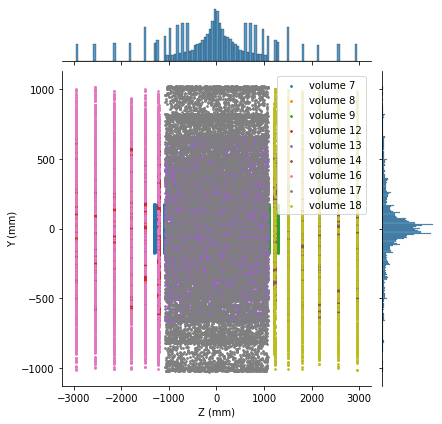

In [14]:
g = sns.jointplot(x=hits.z, y=hits.y, s=1, size=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

volumes = hits.volume_id.unique()
for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v.z, v.y, s=3, label='volume {}'.format(volume))

plt.xlabel('Z (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

And here is how the hits in this event look like in 3D.  Again, a sample from one event.  This combines the previous two charts in 3D.

Notice how the particles penetrate the detector surface along $z$ coordinate.

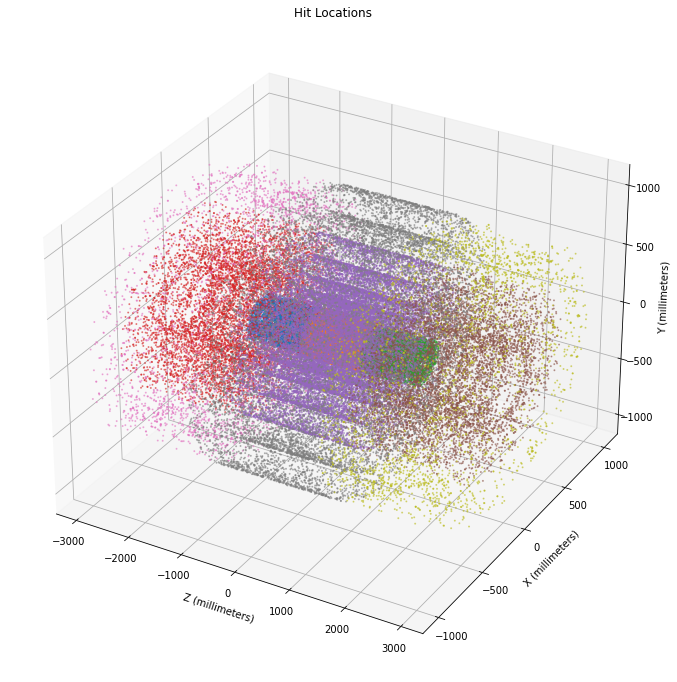

In [15]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')
for volume in volumes:
    v = hits[hits.volume_id == volume]
    ax.scatter(v.z, v.x, v.y, s=1, label='volume {}'.format(volume), alpha=0.5)
ax.set_title('Hit Locations')
ax.set_xlabel('Z (millimeters)')
ax.set_ylabel('X (millimeters)')
ax.set_zlabel('Y (millimeters)')
plt.show()

### Affected Surface Object
The **volume**, **layer** and **module** are nested parts on the detector surface.  The volume is made of layers, which in turn have modules.  Analyzing their response could help us understand if some of them are dead/defective and therefore we may need to account for the bias they cause.

The figure below shows a plot of every combination of `x`, `y`, `volume`, `layer` and `module`.  The colors identify different *volumes*.  Along the main diagonal we have the variables' histograms.

The (`hit_id`, `x`) and (`hit_id`, `y`) pairs show us how different volumes are layered.

This figure idea is taken from [Joshua Bonatt's notebook][josh].

[josh]: https://www.kaggle.com/jbonatt/trackml-eda-etc

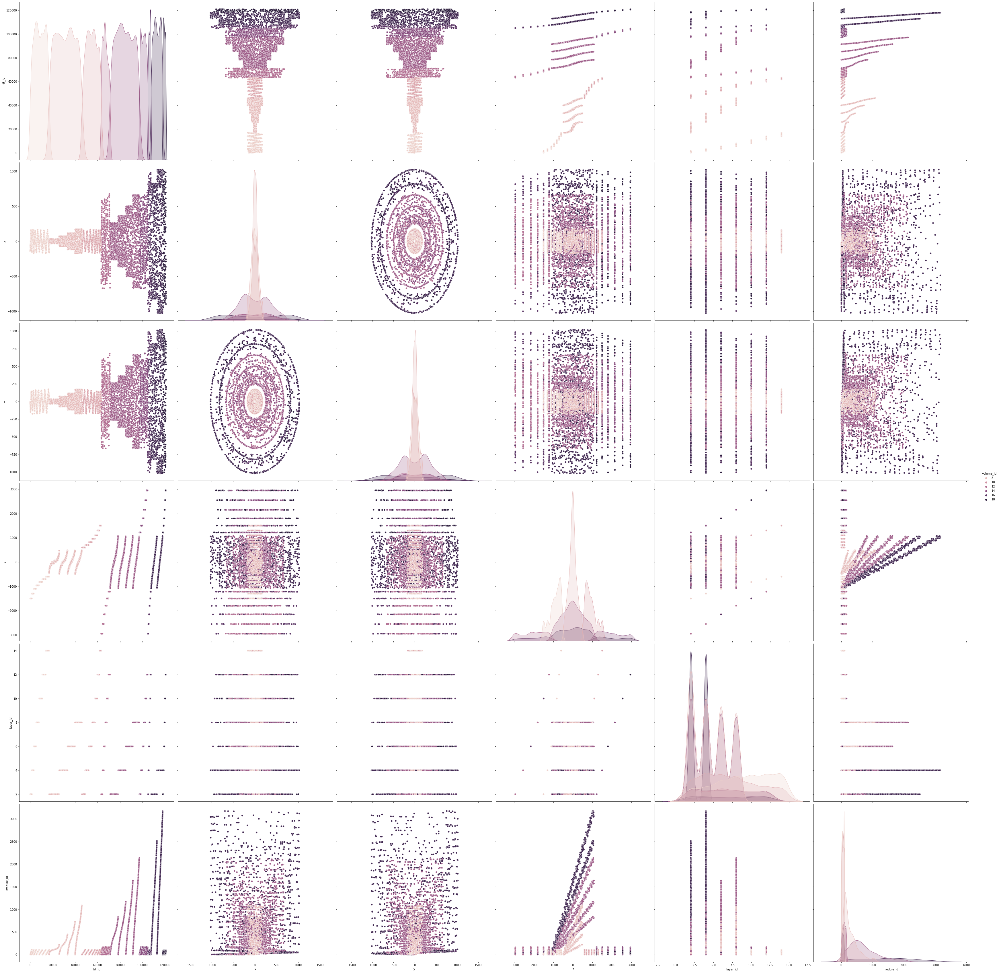

In [16]:
hits_sample = hits.sample(8000)
sns.pairplot(hits_sample, hue='volume_id', height=8)
plt.show()

## Particle Data
The particle data help us understand each particle's initial position, momentum, and charge, which we can join with the event truth data set to get the particle's final position and momentum.  This is needed to identify the tracks that each particle generated.

The data look like this:

In [17]:
particles.head()

,particle_id,vx,vy,vz,px,py,pz,q,nhits
0,4503668346847232,-0.009288,0.009861,-0.077879,-0.055269,0.323272,-0.203492,-1,8
1,4503737066323968,-0.009288,0.009861,-0.077879,-0.948125,0.470892,2.010060,1,11
2,4503805785800704,-0.009288,0.009861,-0.077879,-0.886484,0.105749,0.683881,-1,0
3,4503874505277440,-0.009288,0.009861,-0.077879,0.257539,-0.676718,0.991616,1,12
4,4503943224754176,-0.009288,0.009861,-0.077879,16.439400,-15.548900,-39.824902,1,3


### Hit Rate and Charge Distribution
Let's see the distribution of the number of hits per particle, shown below.  A significant number of particles had no attributed hits, and most of them have positive charge in this event.

<ipython-input-18-d415ecf4537e>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(particles.nhits.values, axlabel='Hits/Particle', bins=50)


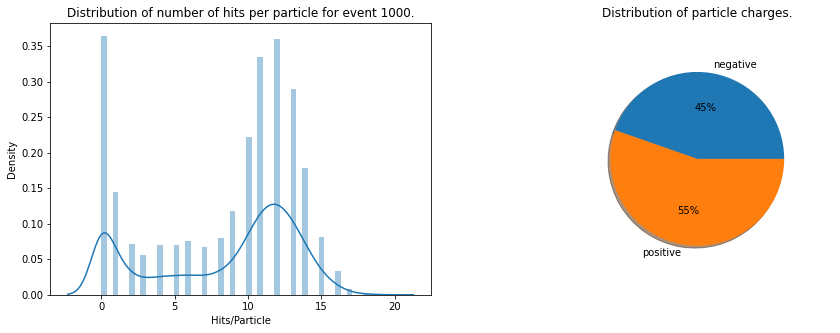

In [18]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.distplot(particles.nhits.values, axlabel='Hits/Particle', bins=50)
plt.title('Distribution of number of hits per particle for event 1000.')
plt.subplot(1, 2, 2)
plt.pie(particles.groupby('q')['vx'].count(),
        labels=['negative', 'positive'],
        autopct='%.0f%%',
        shadow=True,
        radius=0.8)
plt.title('Distribution of particle charges.')
plt.show()

### Initial Position and Momentum
Let's now take a look at the initial position of the particles around the global coordinates' origin $(x, y)=(0,0)$, as shown in the figure below.

The initial position distribution is more concentrated around the origin (less variance) than its hit position (shown above under the Hits Data section).  As the particles hit the detection surface, they tend to scatter as shown in the particle trajectory plot at the end of this notebook.

The colors here show the number of hits for each particle.

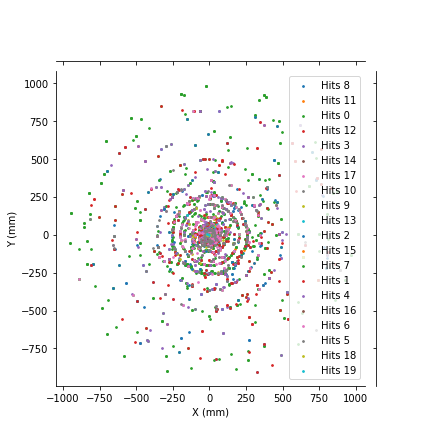

In [19]:
g = sns.jointplot(x=particles.vx, y=particles.vy,  s=3, size=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

n_hits = particles.nhits.unique()
for n_hit in n_hits:
    p = particles[particles.nhits == n_hit]
    plt.scatter(p.vx, p.vy, s=3, label='Hits {}'.format(n_hit))

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

And here is the initial position of the particles in a $z$, $y$ view.  Colors show number of hits.

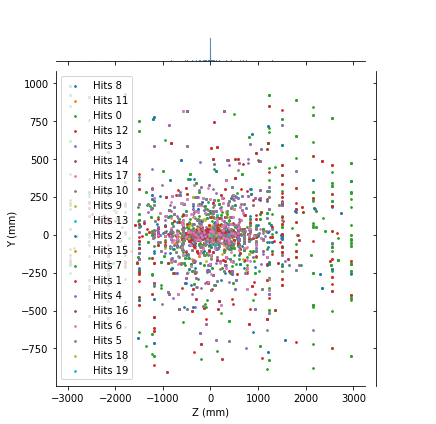

In [21]:
g = sns.jointplot(x=particles.vz, y=particles.vy,  s=3, size=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

n_hits = particles.nhits.unique()
for n_hit in n_hits:
    p = particles[particles.nhits == n_hit]
    plt.scatter(p.vz, p.vy, s=3, label='Hits {}'.format(n_hit))

plt.xlabel('Z (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

And this is what they look like in 3D.

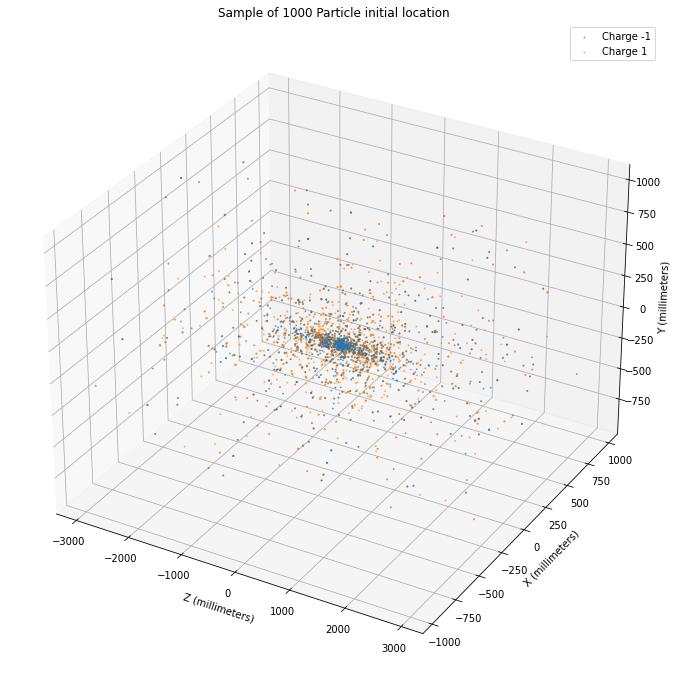

In [22]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')
for charge in [-1, 1]:
    q = particles[particles.q == charge]
    ax.scatter(q.vz, q.vx, q.vy, s=1, label='Charge {}'.format(charge), alpha=0.5)
ax.set_title('Sample of 1000 Particle initial location')
ax.set_xlabel('Z (millimeters)')
ax.set_ylabel('X (millimeters)')
ax.set_zlabel('Y (millimeters)')
ax.legend()
plt.show()

## Pair plot
Let's now take a look at the relationship between different pair combinations of the particle variables.  Again, the colors represent the number of hits.

There is no large skew in the distribution of the number of hits over other variables.  It looks like the particles are targetted towards the global origin $(x,y)=(0,0)$ and are evenly distributed around it.

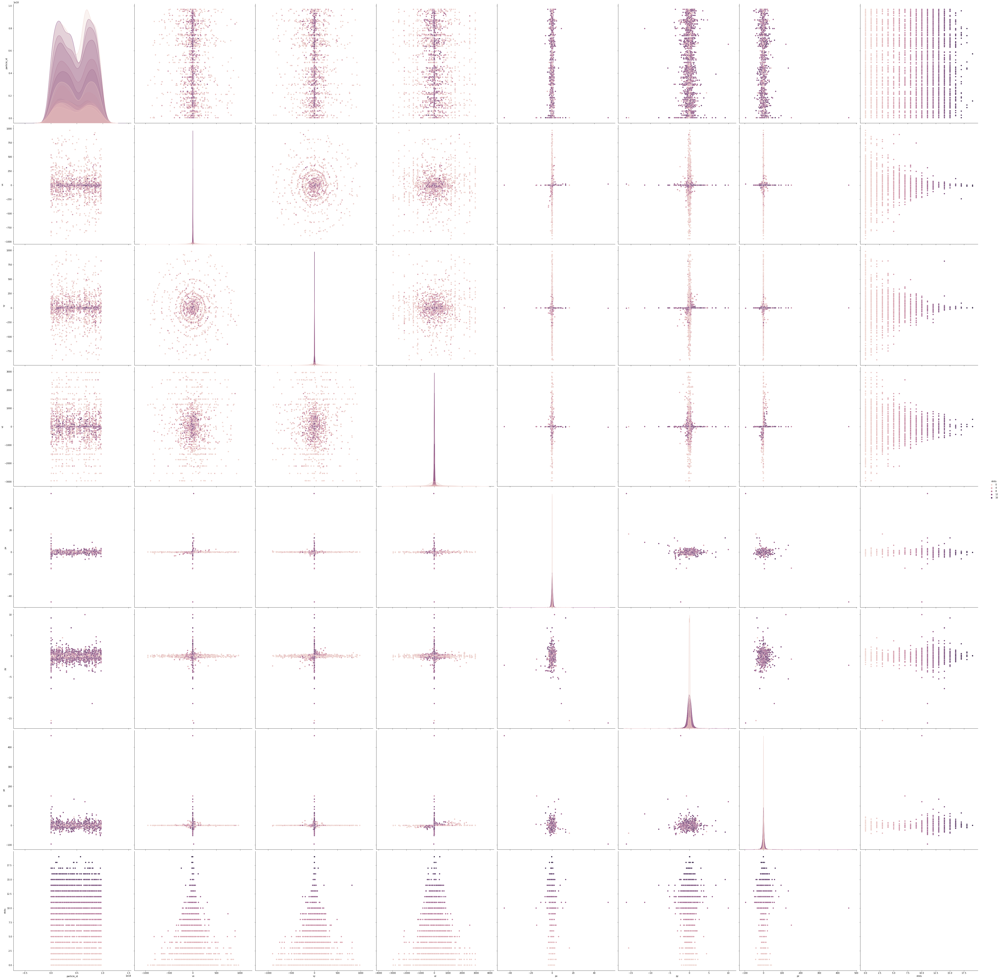

In [24]:
p_sample = particles.sample(8000)
sns.pairplot(p_sample, vars=['particle_id', 'vx', 'vy', 'vz', 'px', 'py', 'pz', 'nhits'], hue='nhits', height=8)
plt.show()

### Particle Trajectory
We can reconstruct the trajectories for a few particles given their intersection points with the detection layers.  As explained in the [competition evaluation page][ceval], hits from straight tracks have larger wieghts, and random tracks or hits with very short tracks have weights of zero.  The figure below shows two such examples.

Thanks to [maka's notebook][traj] for the idea.

[traj]: https://www.kaggle.com/makahana/quick-trajectory-plot
[ceval]: https://www.kaggle.com/c/trackml-particle-identification#evaluation

<ipython-input-25-6b6ed8f9ff7d>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p_traj = (p_traj_surface
<ipython-input-25-6b6ed8f9ff7d>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p_traj2 = (p_traj_surface2


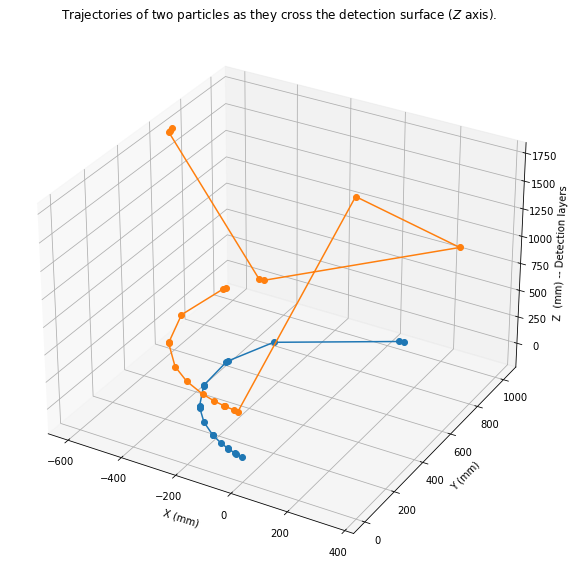

In [25]:
# Get particle id with max number of hits in this event
particle = particles.loc[particles.nhits == particles.nhits.max()].iloc[0]
particle2 = particles.loc[particles.nhits == particles.nhits.max()].iloc[1]

# Get points where the same particle intersected subsequent layers of the observation material
p_traj_surface = truth[truth.particle_id == particle.particle_id][['tx', 'ty', 'tz']]
p_traj_surface2 = truth[truth.particle_id == particle2.particle_id][['tx', 'ty', 'tz']]

p_traj = (p_traj_surface
          .append({'tx': particle.vx, 'ty': particle.vy, 'tz': particle.vz}, ignore_index=True)
          .sort_values(by='tz'))
p_traj2 = (p_traj_surface2
          .append({'tx': particle2.vx, 'ty': particle2.vy, 'tz': particle2.vz}, ignore_index=True)
          .sort_values(by='tz'))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

ax.plot(
    xs=p_traj.tx,
    ys=p_traj.ty,
    zs=p_traj.tz, marker='o')
ax.plot(
    xs=p_traj2.tx,
    ys=p_traj2.ty,
    zs=p_traj2.tz, marker='o')

ax.set_xlabel('X (mm)')
ax.set_ylabel('Y (mm)')
ax.set_zlabel('Z  (mm) -- Detection layers')
plt.title('Trajectories of two particles as they cross the detection surface ($Z$ axis).')
plt.show()

## Training

In [6]:
def init_model(fs = 10):
    model = Sequential()
    model.add(Dense(800, activation='selu', input_shape=(fs,)))
    model.add(Dense(400, activation='selu'))
    model.add(Dense(400, activation='selu'))
    model.add(Dense(400, activation='selu'))
    model.add(Dense(200, activation='selu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

def get_event(event):
    hits= pd.read_csv('train_1/%s-hits.csv'%event)
    cells= pd.read_csv('train_1/%s-cells.csv'%event)
    truth= pd.read_csv('train_1/%s-truth.csv'%event)
    particles= pd.read_csv('train_1/%s-particles.csv'%event)
    return hits, cells, truth, particles

### Step 1 - Prepare training data

In [7]:
train = True
if train:
    Train = []
    for i in tqdm_notebook(range(10,20)):
        event = 'event0000010%02d'%i
        hits, cells, truth, particles = get_event(event)
        hit_cells = cells.groupby(['hit_id']).value.count().values
        hit_value = cells.groupby(['hit_id']).value.sum().values
        features = np.hstack((hits[['x','y','z']]/1000, hit_cells.reshape(len(hit_cells),1)/10,hit_value.reshape(len(hit_cells),1)))
        particle_ids = truth.particle_id.unique()
        particle_ids = particle_ids[np.where(particle_ids!=0)[0]]

        pair = []
        for particle_id in particle_ids:
            hit_ids = truth[truth.particle_id == particle_id].hit_id.values-1
            for i in hit_ids:
                for j in hit_ids:
                    if i != j:
                        pair.append([i,j])
        pair = np.array(pair)   
        Train1 = np.hstack((features[pair[:,0]], features[pair[:,1]], np.ones((len(pair),1))))

        if len(Train) == 0:
            Train = Train1
        else:
            Train = np.vstack((Train,Train1))

        n = len(hits)
        size = len(Train1)*3
        p_id = truth.particle_id.values
        i =np.random.randint(n, size=size)
        j =np.random.randint(n, size=size)
        pair = np.hstack((i.reshape(size,1),j.reshape(size,1)))
        pair = pair[((p_id[i]==0) | (p_id[i]!=p_id[j]))]

        Train0 = np.hstack((features[pair[:,0]], features[pair[:,1]], np.zeros((len(pair),1))))

        print(event, Train1.shape)

        Train = np.vstack((Train,Train0))
    del Train0, Train1

    np.random.shuffle(Train)
    print(Train.shape)

<ipython-input-7-1f6b1f5e3ef9>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(10,20)):


  0%|          | 0/10 [00:00<?, ?it/s]

event000001010 (905342, 11)
event000001011 (1049940, 11)
event000001012 (975962, 11)
event000001013 (937140, 11)
event000001014 (1138386, 11)
event000001015 (1096946, 11)
event000001016 (1054472, 11)
event000001017 (1125976, 11)
event000001018 (787588, 11)
event000001019 (1099946, 11)
(40684261, 11)


### Step 2 - Train model

In [8]:
if train:
    model = init_model()

In [35]:
if train:
    lr=-4
    model.compile(loss=['binary_crossentropy'], optimizer=Adam(learning_rate=10**(lr)), metrics=['accuracy'])
    History = model.fit(x=Train[:,:-1], y=Train[:,-1], batch_size=8000, epochs=20, verbose=2, validation_split=0.05, shuffle=True)

Epoch 1/20
4832/4832 - 24s - loss: 0.1873 - accuracy: 0.9219 - val_loss: 0.1380 - val_accuracy: 0.9479 - 24s/epoch - 5ms/step
Epoch 2/20
4832/4832 - 21s - loss: 0.1233 - accuracy: 0.9559 - val_loss: 0.1086 - val_accuracy: 0.9630 - 21s/epoch - 4ms/step
Epoch 3/20
4832/4832 - 21s - loss: 0.1091 - accuracy: 0.9627 - val_loss: 0.1532 - val_accuracy: 0.9465 - 21s/epoch - 4ms/step
Epoch 4/20
4832/4832 - 20s - loss: 0.1000 - accuracy: 0.9664 - val_loss: 0.0988 - val_accuracy: 0.9661 - 20s/epoch - 4ms/step
Epoch 5/20
4832/4832 - 20s - loss: 0.0940 - accuracy: 0.9688 - val_loss: 0.0851 - val_accuracy: 0.9714 - 20s/epoch - 4ms/step
Epoch 6/20
4832/4832 - 20s - loss: 0.0889 - accuracy: 0.9708 - val_loss: 0.0824 - val_accuracy: 0.9732 - 20s/epoch - 4ms/step
Epoch 7/20
4832/4832 - 20s - loss: 0.0838 - accuracy: 0.9725 - val_loss: 0.0833 - val_accuracy: 0.9734 - 20s/epoch - 4ms/step
Epoch 8/20
4832/4832 - 20s - loss: 0.0803 - accuracy: 0.9737 - val_loss: 0.0763 - val_accuracy: 0.9747 - 20s/epoch - 4

In [12]:
def plot_loss_curves(history):
    """
    Returns separate loss curves for training and validation metrics.
    Args:
      history: TensorFlow model History object (see: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History)
    """
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))
    
    plt.figure(figsize=(20, 7))
    
    # Plot loss
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.figure(figsize=(20, 7))
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend();

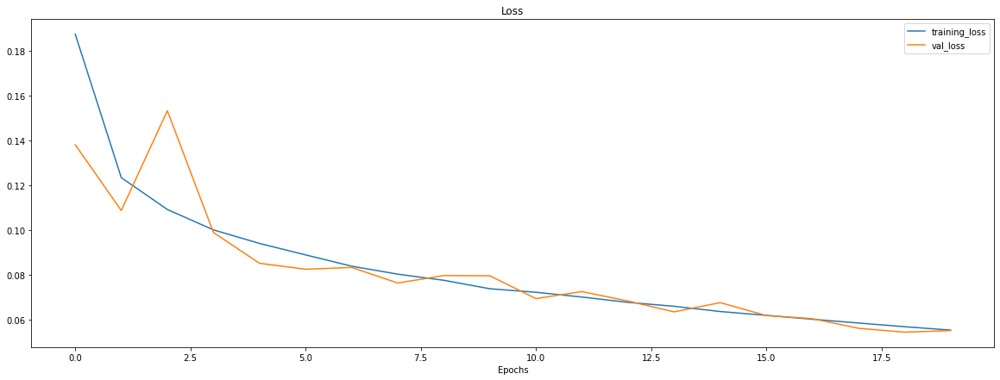

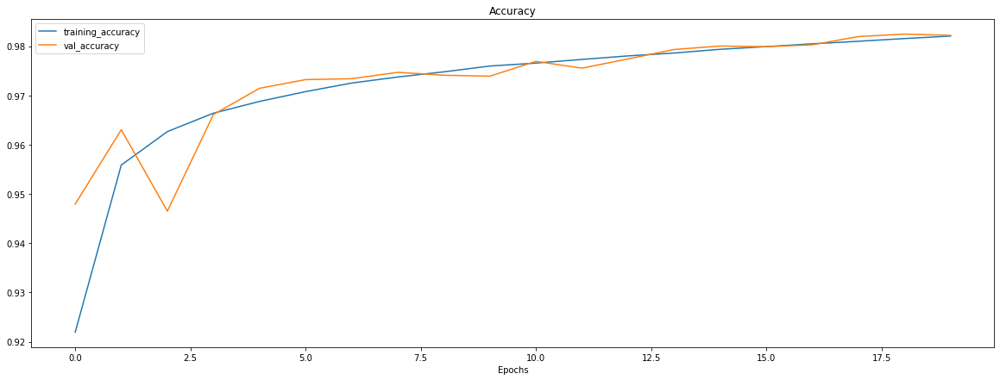

In [51]:
plot_loss_curves(History)

In [52]:
# Save the model
model.save("TrackML_v1.h5")

### Step 3 - Hard Negative Mining

In [9]:
#load trained model

model = tf.keras.models.load_model("TrackML_v1.h5")

In [10]:
if train:
    Train_hard = []

    for i in tqdm_notebook(range(10,20)):

        event = 'event0000010%02d'%i
        hits, cells, truth, particles = get_event(event)
        hit_cells = cells.groupby(['hit_id']).value.count().values
        hit_value = cells.groupby(['hit_id']).value.sum().values
        features = np.hstack((hits[['x','y','z']]/1000, hit_cells.reshape(len(hit_cells),1)/10,hit_value.reshape(len(hit_cells),1)))

        size=30000000
        n = len(truth)
        i =np.random.randint(n, size=size)
        j =np.random.randint(n, size=size)
        p_id = truth.particle_id.values
        pair = np.hstack((i.reshape(size,1),j.reshape(size,1)))
        pair = pair[((p_id[i]==0) | (p_id[i]!=p_id[j]))]

        Train0 = np.hstack((features[pair[:,0]], features[pair[:,1]], np.zeros((len(pair),1))))

        pred = model.predict(Train0[:,:-1], batch_size=20000)
        s = np.where(pred>0.5)[0]

        print(event, len(Train0), len(s))

        if len(Train_hard) == 0:
            Train_hard = Train0[s]
        else:
            Train_hard = np.vstack((Train_hard,Train0[s]))
    del Train0
    print(Train_hard.shape)

<ipython-input-10-e712a92af210>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(10,20)):


  0%|          | 0/10 [00:00<?, ?it/s]

1500/1500 [==============================] - 7s 3ms/step
event000001010 29997188 396817
1500/1500 [==============================] - 6s 4ms/step
event000001011 29997548 388767
1500/1500 [==============================] - 5s 3ms/step
event000001012 29997361 380701
1500/1500 [==============================] - 5s 4ms/step
event000001013 29997246 384614
1500/1500 [==============================] - 5s 3ms/step
event000001014 29997704 389280
1500/1500 [==============================] - 5s 3ms/step
event000001015 29997564 393619
1500/1500 [==============================] - 5s 3ms/step
event000001016 29997520 380280
1500/1500 [==============================] - 5s 3ms/step
event000001017 29997600 384937
1500/1500 [==============================] - 5s 3ms/step
event000001018 29997001 394530
1500/1500 [==============================] - 5s 3ms/step
event000001019 29997606 390200
(3883745, 11)


In [11]:
if train:
    Train = np.vstack((Train,Train_hard))
    np.random.shuffle(Train)
    print(Train.shape)

(44568006, 11)


In [13]:
plot_loss_curvesrain:
    lr=-4
    model.compile(loss=['binary_crossentropy'], optimizer=Adam(learning_rate=10**(lr)), metrics=['accuracy'])
    History_HN = model.fit(x=Train[:,:-1], y=Train[:,-1], batch_size=8000, epochs=30, verbose=2, validation_split=0.05, shuffle=True)

Epoch 1/30
5293/5293 - 23s - loss: 0.1400 - accuracy: 0.9431 - val_loss: 0.1375 - val_accuracy: 0.9454 - 23s/epoch - 4ms/step
Epoch 2/30
5293/5293 - 21s - loss: 0.1334 - accuracy: 0.9468 - val_loss: 0.1321 - val_accuracy: 0.9470 - 21s/epoch - 4ms/step
Epoch 3/30
5293/5293 - 21s - loss: 0.1282 - accuracy: 0.9495 - val_loss: 0.1303 - val_accuracy: 0.9481 - 21s/epoch - 4ms/step
Epoch 4/30
5293/5293 - 21s - loss: 0.1235 - accuracy: 0.9520 - val_loss: 0.1226 - val_accuracy: 0.9529 - 21s/epoch - 4ms/step
Epoch 5/30
5293/5293 - 22s - loss: 0.1191 - accuracy: 0.9541 - val_loss: 0.1187 - val_accuracy: 0.9539 - 22s/epoch - 4ms/step
Epoch 6/30
5293/5293 - 22s - loss: 0.1152 - accuracy: 0.9561 - val_loss: 0.1143 - val_accuracy: 0.9563 - 22s/epoch - 4ms/step
Epoch 7/30
5293/5293 - 22s - loss: 0.1115 - accuracy: 0.9577 - val_loss: 0.1106 - val_accuracy: 0.9587 - 22s/epoch - 4ms/step
Epoch 8/30
5293/5293 - 22s - loss: 0.1081 - accuracy: 0.9593 - val_loss: 0.1063 - val_accuracy: 0.9608 - 22s/epoch - 4

In [17]:
# Save hard negative mined model
model.save("TrackML_hard_negative.h5")

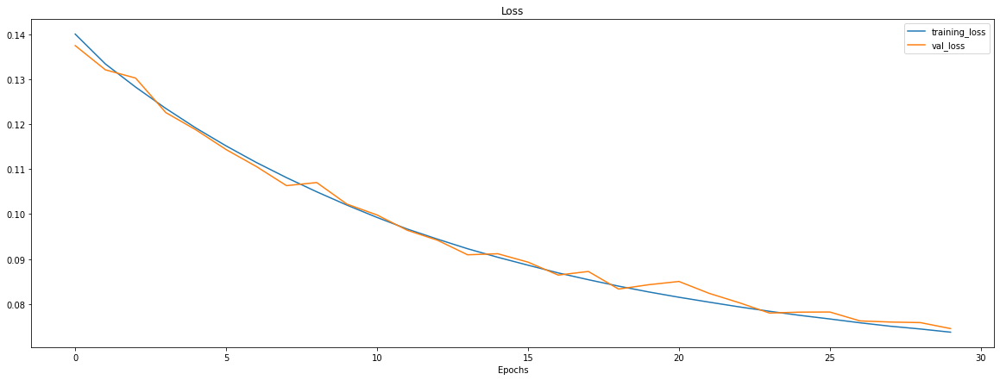

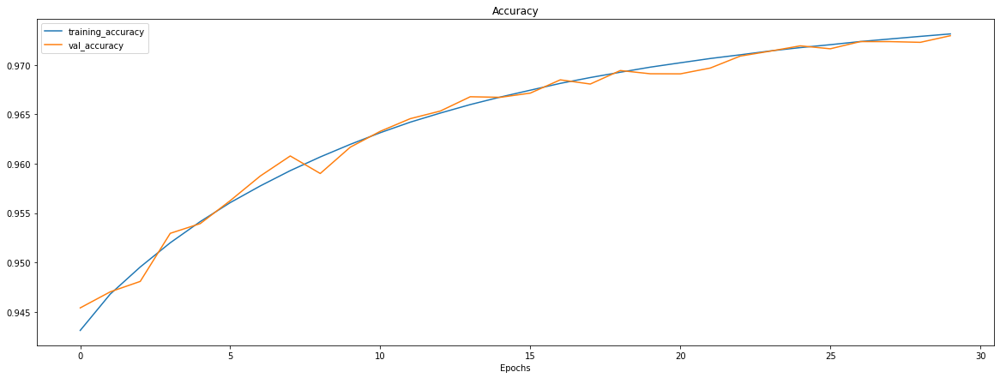

In [18]:
plot_loss_curves(History_HN)

### Step 4 - Evaluation

In [14]:
event = 'event000001001'
hits, cells, truth, particles = get_event(event)
hit_cells = cells.groupby(['hit_id']).value.count().values
hit_value = cells.groupby(['hit_id']).value.sum().values
features = np.hstack((hits[['x','y','z']]/1000, hit_cells.reshape(len(hit_cells),1)/10,hit_value.reshape(len(hit_cells),1)))
count = hits.groupby(['volume_id','layer_id','module_id'])['hit_id'].count().values
module_id = np.zeros(len(hits), dtype='int32')

for i in range(len(count)):
    si = np.sum(count[:i])
    module_id[si:si+count[i]] = i

In [15]:
def get_path(hit, mask, thr):
    path = [hit]
    a = 0
    while True:
        c = get_predict(path[-1], thr/2)
        mask = (c > thr)*mask
        mask[path[-1]] = 0
        
        if 1:
            cand = np.where(c>thr)[0]
            if len(cand)>0:
                mask[cand[np.isin(module_id[cand], module_id[path])]]=0
                
        a = (c + a)*mask
        if a.max() < thr*len(path):
            break
        path.append(a.argmax())
    return path

def get_predict(hit, thr=0.5):
    Tx = np.zeros((len(truth),10))
    Tx[:,5:] = features
    Tx[:,:5] = np.tile(features[hit], (len(Tx), 1))
    pred = model.predict(Tx, batch_size=len(Tx))[:,0]
    # TTA
    idx = np.where(pred > thr)[0]
    Tx2 = np.zeros((len(idx),10))
    Tx2[:,5:] = Tx[idx,:5]
    Tx2[:,:5] = Tx[idx,5:]    
    pred1 = model.predict(Tx2, batch_size=len(idx))[:,0]
    pred[idx] = (pred[idx] + pred1)/2
    return pred

In [16]:
# select one hit to construct a track
for hit in range(3):
    path = get_path(hit, np.ones(len(truth)), 0.95)
    gt = np.where(truth.particle_id==truth.particle_id[hit])[0]
    print('hit_id = ', hit+1)
    print('reconstruct :', path)
    print('ground truth:', gt.tolist())

1/1 [==============================] - 0s 25ms/step
hit_id =  1
reconstruct : [0, 2665, 2720, 4477, 1228, 6494, 6584, 1259, 8937, 6556, 4427, 9011, 9023, 11352]
ground truth: [0, 1236, 1259, 2656, 2711, 4429, 4501, 6492, 6568, 6624, 8927, 9006, 9024, 11361]
1/1 [==============================] - 0s 15ms/step
hit_id =  2
reconstruct : [1, 1314, 4490, 2761, 6554, 4548, 2716, 9058, 8997, 6600, 8939, 1270, 11365, 40, 6482]
ground truth: [1, 1270, 1314, 2703, 2763, 4478, 4546, 6482, 6527, 6607, 8917, 9003, 9038, 11366]
1/1 [==============================] - 0s 16ms/step
hit_id =  3
reconstruct : [2, 1260, 2697, 4536, 1296, 2766, 4494, 6564, 6485, 4437, 6619, 8908]
ground truth: [2, 1258, 2709, 2756, 4428, 4480, 4529, 6480, 6541, 6608, 8925]
